# OpenTTD AI Testing

In [111]:
from openttdlab import run_experiments, bananas_ai, local_folder, parse_savegame
import pandas as pd
import plotly.express as px
import os
print("Import success")

Import success


In [113]:
# run experiments
# Run experiments...
ss_directory = 'C://Program Files (x86)//Steam//steamapps//common//OpenTTD//ai//screenshots'
results = run_experiments(
    openttd_version='13.4',  # ... for a specific versions of OpenTTD
    opengfx_version='7.1',   # ... and a specific versions of OpenGFX
    experiments=(
       {
         # ... for random seeds
         'seed': seed,
         # ... running specific AIs. In this case a single AI, with no
         # parameters, fetching it from https://bananas.openttd.org/package/ai
         'ais': (
             bananas_ai('534d504c', 'SimpleAI', ai_params=(('use_roadvehs', 1), ('use_trains', 0))),
         ),
         # ... each for a number of (in game) days
         'days': 365 * 4 + 1, 
       }
       for seed in range(0, 10)
    ),
    
    final_screenshot_directory = ss_directory
)

Output()

KeyboardInterrupt: 

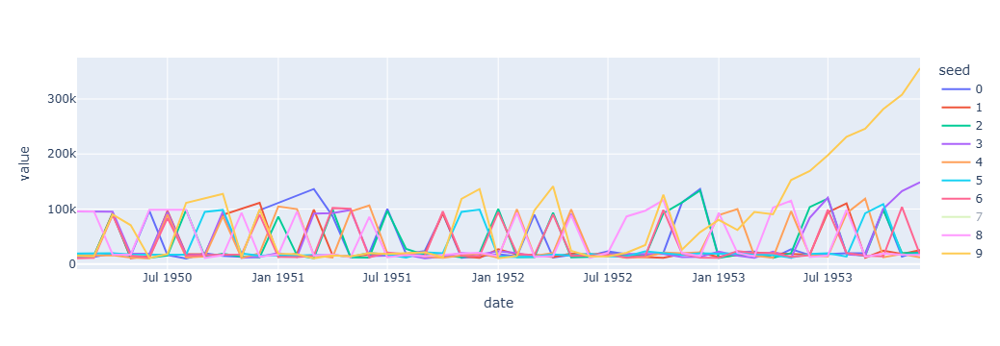

In [5]:
df = pd.DataFrame(
    {
        'seed': row['experiment']['seed'],
        'date': row['date'],
        'money': row['chunks']['PLYR']['0']['money'],
    }
    for row in results
)
df = df.pivot(index='date', columns='seed', values='money')
fig = px.line(df)
fig.show()

In [23]:
print(results[469]['date'])

1953-12-01


In [69]:
filtered_results = [row for row in results if row.get('date') == results[469]['date']]

In [73]:
aggregate_fitness = 0
for row in filtered_results:
    aggregate_fitness += (row['chunks']['PLYR']['0']['cur_economy'][0]['income'] - row['chunks']['PLYR']['0']['cur_economy'][0]['expenses'])

print(aggregate_fitness)

595494


In [31]:
print(results[150]['chunks']['PLYR']['0']['cur_economy'][0]['income'] - results[150]['chunks']['PLYR']['0']['cur_economy'][0]['expenses'])

3264


In [22]:
# run experiments
# Run experiments...
ss_directory = 'C://Program Files (x86)//Steam//steamapps//common//OpenTTD//ai//screenshots'
results = run_experiments(
    openttd_version='13.4',  # ... for a specific versions of OpenTTD
    opengfx_version='7.1',   # ... and a specific versions of OpenGFX
    experiments=(
       {
         # ... for random seeds
         'seed': seed,
         # ... running specific AIs. In this case a single AI, with no
         # parameters, fetching it from https://bananas.openttd.org/package/ai
         'ais': (
             bananas_ai('534d504c', 'SimpleAI', ai_params=(('use_roadvehs', 1), ('use_trains', 1), ('waiting_time', 365))),
         ),
         # ... each for a number of (in game) days
         'days': 365 * 4 + 1,
       }
       for seed in range(0, 10)
    ),
)

Output()

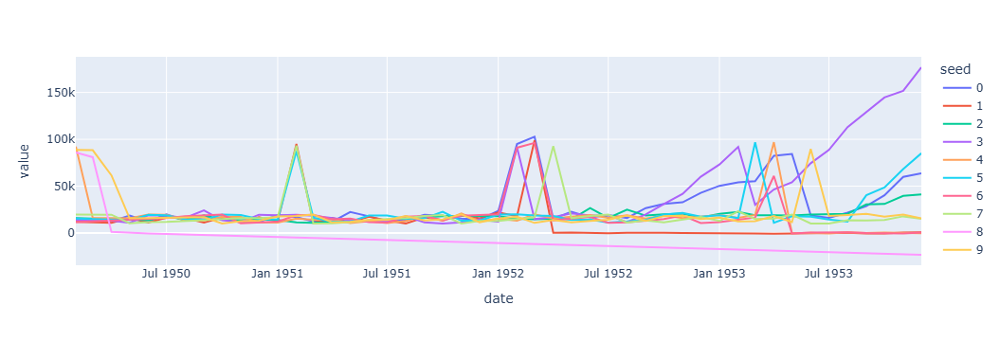

In [108]:
df = pd.DataFrame(
    {
        'seed': row['experiment']['seed'],
        'date': row['date'],
        'money': row['chunks']['PLYR']['0']['money'],
    }
    for row in results
)
df = df.pivot(index='date', columns='seed', values='money')
fig = px.line(df)
fig.show()

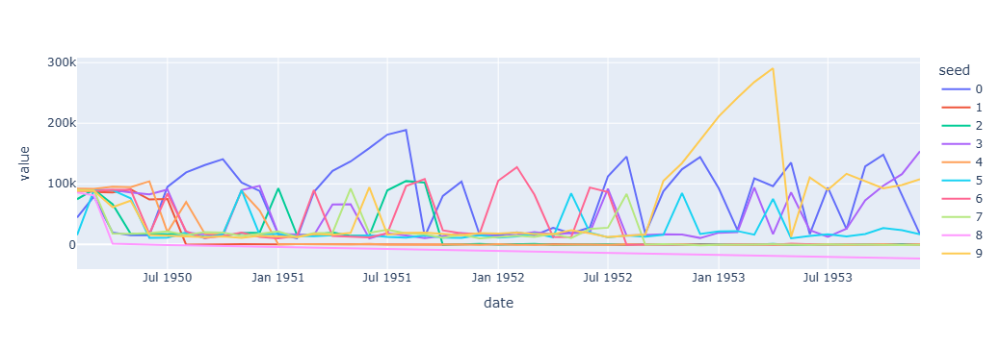

In [103]:
df = pd.DataFrame(
    {
        'seed': row['experiment']['seed'],
        'date': row['date'],
        'money': row['chunks']['PLYR']['0']['money'],
    }
    for row in results
)
df = df.pivot(index='date', columns='seed', values='money')
fig = px.line(df)
fig.show()

In [79]:
# run experiments
# Run experiments...

folderpath = 'C://Program Files (x86)//Steam//steamapps//common//OpenTTD//ai//MyNewAI'
ss_directory = 'C://Program Files (x86)//Steam//steamapps//common//OpenTTD//ai//screenshots'

results = run_experiments(
    openttd_version='13.4',  # ... for a specific version of OpenTTD
    opengfx_version='7.1',   # ... and a specific version of OpenGFX
    experiments=(
       {
         # ... for random seeds
         'seed': seed,
         # ... running specific AIs. In this case, a single AI, with no
         # parameters, fetching it from https://bananas.openttd.org/package/ai
         'ais': (
             local_folder(folderpath, 'MyNewAI', ai_params=(('max_distance', 200), ('initial_vehicles', 3), ('add_new_vehicle_age', 90),
                                                           ('max_age_left', 0))),
         ),
         # ... each for a number of (in game) days
         'days': 365 * 4 + 1,
       }
       for seed in range(0, 10)
    ),
)

Output()

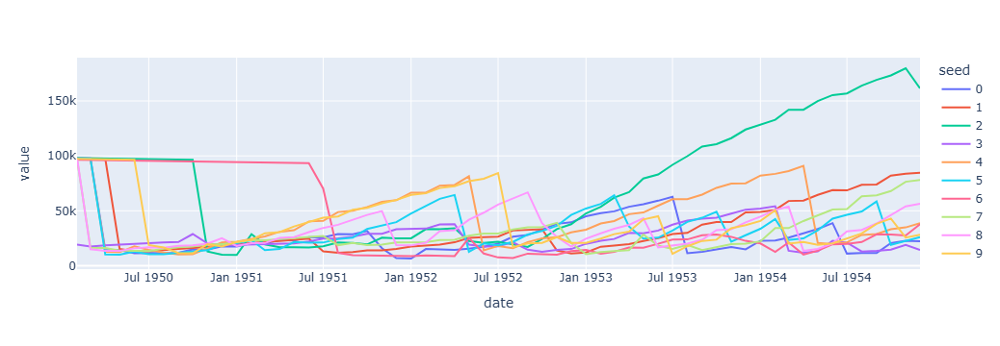

In [7]:
df = pd.DataFrame(
    {
        'seed': row['experiment']['seed'],
        'date': row['date'],
        'money': row['chunks']['PLYR']['0']['money'],
    }
    for row in results
)
df = df.pivot(index='date', columns='seed', values='money')
fig = px.line(df)
fig.show()

In [177]:
filtered_results = [row for row in results if row.get('date') == results[589]['date']]
aggregate_fitness = 0
for row in filtered_results:
    aggregate_fitness += (row['chunks']['PLYR']['0']['cur_economy'][0]['income'] - row['chunks']['PLYR']['0']['cur_economy'][0]['expenses'])

print(aggregate_fitness)

116107


In [175]:
print(len(results))

590


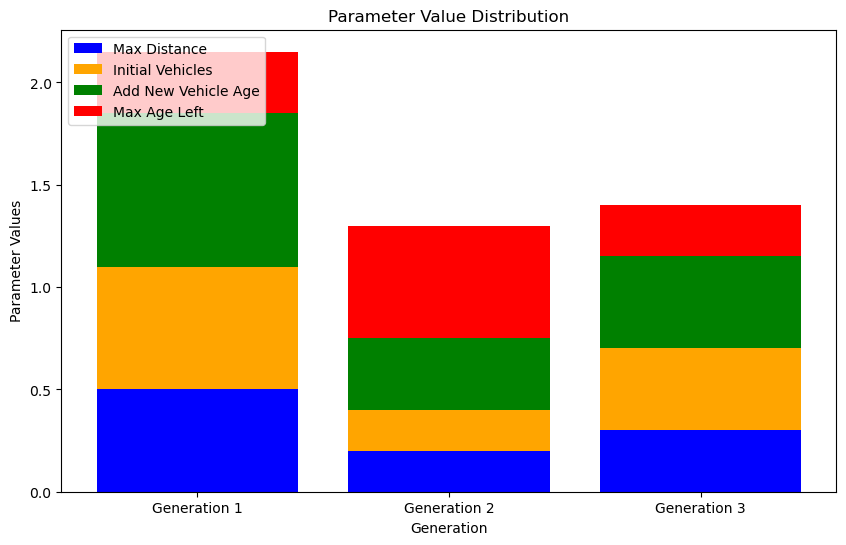

In [107]:
import matplotlib.pyplot as plt
import numpy as np

# Example data
data = [
    [0.50, 0.60, 0.75, 0.30],  # Individual 1
    [0.20, 0.20, 0.35, 0.55],  # Individual 2
    [0.30, 0.40, 0.45, 0.25],  # Individual 3
]

# Labels for the segments
labels = ['Max Distance', 'Initial Vehicles', 'Add New Vehicle Age', 'Max Age Left']
colors = ['blue', 'orange', 'green', 'red']

# Number of individuals
num_bars = len(data)

# X positions for the bars
x_positions = np.arange(num_bars)

# Create the stacked bars
plt.figure(figsize=(10, 6))
for i, values in enumerate(data):  # Iterate through each individual
    bottom_value = 0
    for j, value in enumerate(values):  # Iterate through each metric
        plt.bar(
            x=x_positions[i],  # Position of the bar
            height=value,  # Height of this stack segment
            bottom=bottom_value,  # Starting position of this stack
            color=colors[j % len(colors)],  # Segment color
            label=f'{labels[j]}' if i == 0 else ""  # Add label only for the first bar
        )
        bottom_value += value  # Update the bottom for the next stack

# Add labels, legend, and axis information
plt.title('Parameter Value Distribution')
plt.xlabel('Generation')
plt.ylabel('Parameter Values')
plt.xticks(x_positions, [f'Generation {i + 1}' for i in range(num_bars)])  # Label x-axis for each individual
plt.legend(loc='upper left')

# Show the plot
plt.show()


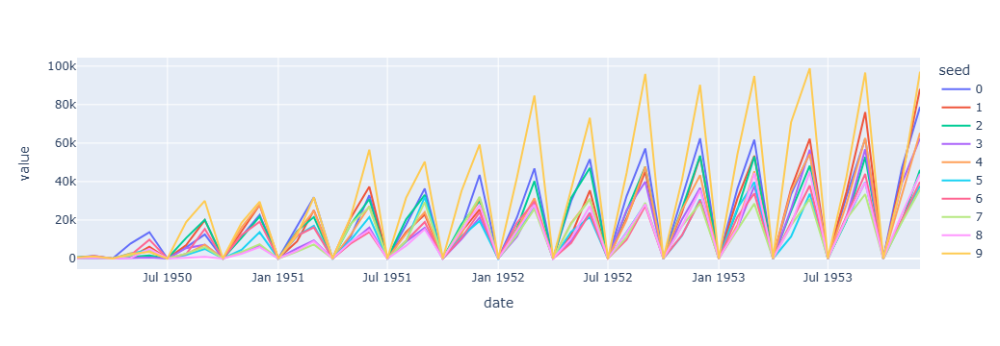

In [140]:
fitness_function = pd.DataFrame(
    {
        'seed': row['experiment']['seed'],
        'date': row['date'],
        'profit': row['chunks']['PLYR']['0']['cur_economy'][0]['income'] - row['chunks']['PLYR']['0']['cur_economy'][0]['expenses']
    }
    for row in results
)

fitness_function = fitness_function.pivot(index = 'date', columns = 'seed', values = 'profit')
fig = px.line(fitness_function)
fig.show()

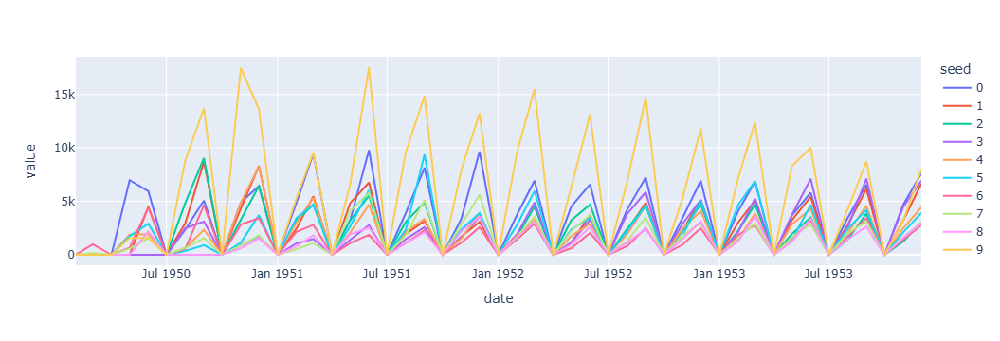

In [197]:
fitness_function = pd.DataFrame(
    {
        'seed': row['experiment']['seed'],
        'date': row['date'],
        'fitness_function': (row['chunks']['PLYR']['0']['cur_economy'][0]['income']/ (len(row['chunks']['ROAD'])/2))
        if len(row['chunks']['ROAD']) > 0 else 0
    }
    for row in results
)

fitness_function = fitness_function.pivot(index = 'date', columns = 'seed', values = 'fitness_function')
fig = px.line(fitness_function)
fig.show()

In [75]:
for element in results[0]:
    print(element)

openttd_version
opengfx_version
savegame_version
experiment
date
error
output
chunks


In [67]:
for experiment in results[0]['experiment']:
    print(experiment)
print(results[0]['output'])

seed
ais
days



In [133]:
for chunk in results[0]['chunks']:
    print(chunk)

GLOG
MAPS
MAPT
MAPH
MAPO
MAP2
M3LO
M3HI
MAP5
MAPE
MAP7
MAP8
DATE
VIEW
CHTS
PATS
VEHS
DEPT
BKOR
ORDR
ORDL
INDY
IIDS
TIDS
IBLD
ITBL
CAPY
ECMY
SUBS
CMDL
CMPU
GOAL
STPE
STPA
LEAE
LEAT
EIDS
ENGN
HIDS
CITY
SIGN
STNN
ROAD
PLYR
AIPL
GSTR
GSDT
ANIT
NGRF
GRPS
CAPA
ERNW
RAIL
LGRP
LGRJ
LGRS
ATID
APID
OBID
OBJS
PSAC


In [81]:
## fitness function that gives the average profit/income over the number of routes (could be replaced to be in terms of cost)
## we have to divide by 2 because the 'ROAD' chunks identify the 2 ends of a route (the length is always even)
print((results[260]['chunks']['PLYR']['0']['cur_economy'][0]['income']/ (len(results[260]['chunks']['ROAD'])/2)))

2519.1666666666665


In [83]:
## fitness function that gives the average profit/income over the number of total vehicles (could be replaced to be in terms of cost)
print((results[260]['chunks']['PLYR']['0']['cur_economy'][0]['income']/ len(results[260]['chunks']['VEHS'])))

487.5806451612903


In [85]:
## The average wait time per vehicle (in-game units)
total_wait_time = sum(item['wait_time'] for item in results[260]['chunks']['ORDR'].values())
print((total_wait_time/len(results[260]['chunks']['VEHS'])))

78.7741935483871


In [93]:
print(results[260]['chunks']['ROAD'])

{'0': {'xy': 41068, 'status': 3, 'next': 0}, '1': {'xy': 24613, 'status': 3, 'next': 0}, '2': {'xy': 24362, 'status': 3, 'next': 0}, '3': {'xy': 21580, 'status': 3, 'next': 0}, '4': {'xy': 23626, 'status': 3, 'next': 0}, '5': {'xy': 58149, 'status': 3, 'next': 0}, '6': {'xy': 58150, 'status': 3, 'next': 0}, '7': {'xy': 46640, 'status': 130, 'next': 0}, '8': {'xy': 45107, 'status': 130, 'next': 0}, '9': {'xy': 38444, 'status': 3, 'next': 0}, '10': {'xy': 37422, 'status': 3, 'next': 0}, '11': {'xy': 12050, 'status': 3, 'next': 0}}


In [ ]:
GLOG # dictionary for superfluous information
MAPS # dimensions of the map
MAPT - MAP8 # --- (empty dictionary) (don't really know what this does)
DATE # shows the number of ticks and the date (number of days passed since the year 0) (and etc.)
VIEW # current camera coordinates
CHTS # cheat_menu statistics of how many of each cheat has been used
PATS # difficulty, economy, vehicle, station,linkgraph, construction, pf(pathfinding), order, game_creation, local attributes for game setting
VEHS # dictionary of all vehicles' object attributes
DEPT # dictionary of depots present in the map belonging to the player
BKOR # ---
ORDR # all the order stats (waiting time, travel time, and etc.)
ORDL # vehicle order list? not quite sure of this one
INDY # industry stats (produced cargo, location, how many were transported, and etc.) (*what does the town key signify?)
IIDS - TIDS # ---
IBLD # tracks wanted industries?
CAPY # ---
ECMY # economy stats on inflation and interest rates
SUBS # available subsidies and their stats (type, source, destination, and etc.)
EIDS # list of grf, type, internal and substitute id's
ENGN # engine stats (introduction date, age, reliability, and etc)
HIDS # ---
CITY # town stats (growth rate, coordinates, ratings, and etc.)
SIGN # empty but supposedly on the existing road/rail signs on the map?
STNN # general information of facility (station) and its type (airport, rail, road, etc.)
ROAD # information regarding road stations (owner, location, and status)
PLYR # general company information (income, expenses, months in bankruptcy, and etc.)
AIPL # name and settings (from info.nut) of all ais in game 

GSTR-GSDT # game script information (could be used to store and save custom data perhaps?)
# GSDT - Game script data table?
# GSTR - Game script ---?

ANIT # tile of coordinates of animations
NGRF # new GRF general information
GRPS # general information about the groups of vehicles
CAPA # cargo and passenger attributes (location, days in transit, souce tile, and etc.)
ERNW # ---
RAIL # dictionary of labels? (unsure as to what the labels are)
OBJS # an object's characteristics (height, width, build date, and etc.) especially which town it is tied to.